In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
import cv2
from glob import glob
import random
from tensorflow.keras.preprocessing.image import load_img
from IPython.display import FileLink
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.layers import GlobalAveragePooling2D
from tqdm import tqdm
import tensorflow.keras.backend as K
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.preprocessing import image
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import load_model, Model

In [2]:
from tensorflow.keras.mixed_precision import set_global_policy

set_global_policy("mixed_float16")

INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPU will likely run quickly with dtype policy mixed_float16 as it has compute capability of at least 7.0. Your GPU: NVIDIA GeForce RTX 4050 Laptop GPU, compute capability 8.9


In [3]:
dataset_path = "Multi_Class_p1/Multi Cancer/Unified_Classes/"

# Check the class folders
classes = os.listdir(dataset_path)
print("Classes:", classes)

# Count images per class
class_counts = {cls: len(os.listdir(os.path.join(dataset_path, cls))) for cls in classes}
print("Class Distribution:", class_counts)


Classes: ['all_benign', 'all_early', 'all_pre', 'all_pro', 'brain_glioma', 'brain_menin', 'brain_notumor', 'brain_tumor', 'breast_benign', 'breast_malignant', 'cervix_dyk', 'cervix_koc', 'cervix_mep', 'cervix_pab', 'cervix_sfi', 'colon_aca', 'colon_bnt', 'kidney_normal', 'kidney_tumor', 'lung_aca', 'lung_bnt', 'lung_scc', 'lymph_cll', 'lymph_fl', 'lymph_mcl', 'oral_normal', 'oral_scc']
Class Distribution: {'all_benign': 5000, 'all_early': 5000, 'all_pre': 5000, 'all_pro': 5000, 'brain_glioma': 5000, 'brain_menin': 5000, 'brain_notumor': 2000, 'brain_tumor': 5000, 'breast_benign': 5000, 'breast_malignant': 5000, 'cervix_dyk': 5000, 'cervix_koc': 5000, 'cervix_mep': 5000, 'cervix_pab': 5000, 'cervix_sfi': 5000, 'colon_aca': 5000, 'colon_bnt': 5000, 'kidney_normal': 5000, 'kidney_tumor': 5000, 'lung_aca': 5000, 'lung_bnt': 5000, 'lung_scc': 5000, 'lymph_cll': 5000, 'lymph_fl': 5000, 'lymph_mcl': 5000, 'oral_normal': 5001, 'oral_scc': 5001}


In [4]:
dataset_path = "Multi_Class_p1/Multi Cancer/Unified_Classes/"

classes = sorted([cls for cls in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, cls))])

class_counts = {cls: len(os.listdir(os.path.join(dataset_path, cls))) for cls in classes}

df_class_distribution = pd.DataFrame(list(class_counts.items()), columns=["Class Name", "Image Count"])

df_class_distribution.insert(0, "S.No", range(1, len(df_class_distribution) + 1))

df_class_distribution = df_class_distribution.sort_values(by="Class Name").reset_index(drop=True)
df_class_distribution["S.No"] = df_class_distribution.index + 1  # Recalculate serial number after sorting

print(df_class_distribution.to_string(index=False))

 S.No       Class Name  Image Count
    1       all_benign         5000
    2        all_early         5000
    3          all_pre         5000
    4          all_pro         5000
    5     brain_glioma         5000
    6      brain_menin         5000
    7    brain_notumor         2000
    8      brain_tumor         5000
    9    breast_benign         5000
   10 breast_malignant         5000
   11       cervix_dyk         5000
   12       cervix_koc         5000
   13       cervix_mep         5000
   14       cervix_pab         5000
   15       cervix_sfi         5000
   16        colon_aca         5000
   17        colon_bnt         5000
   18    kidney_normal         5000
   19     kidney_tumor         5000
   20         lung_aca         5000
   21         lung_bnt         5000
   22         lung_scc         5000
   23        lymph_cll         5000
   24         lymph_fl         5000
   25        lymph_mcl         5000
   26      oral_normal         5001
   27         oral_scc      

In [5]:
file_paths = []
labels = []

for cls in classes:
    cls_folder = os.path.join(dataset_path, cls)
    for file in os.listdir(cls_folder):
        if file.lower().endswith(('.png', '.jpg', '.jpeg')):
            file_paths.append(os.path.join(cls_folder, file))
            labels.append(cls)

df = pd.DataFrame({
    'file_path': file_paths,
    'label': labels
})

df = df.sample(frac=1, random_state=42).reset_index(drop=True)

print(df)


                                                file_path             label
0       Multi_Class_p1/Multi Cancer/Unified_Classes/br...  breast_malignant
1       Multi_Class_p1/Multi Cancer/Unified_Classes/al...           all_pro
2       Multi_Class_p1/Multi Cancer/Unified_Classes/br...     breast_benign
3       Multi_Class_p1/Multi Cancer/Unified_Classes/lu...          lung_aca
4       Multi_Class_p1/Multi Cancer/Unified_Classes/al...           all_pre
...                                                   ...               ...
131997  Multi_Class_p1/Multi Cancer/Unified_Classes/ly...         lymph_cll
131998  Multi_Class_p1/Multi Cancer/Unified_Classes/ly...         lymph_mcl
131999  Multi_Class_p1/Multi Cancer/Unified_Classes/lu...          lung_scc
132000  Multi_Class_p1/Multi Cancer/Unified_Classes/or...          oral_scc
132001  Multi_Class_p1/Multi Cancer/Unified_Classes/ly...         lymph_mcl

[132002 rows x 2 columns]


C:\Users\saish\AppData\Local\Temp\ipykernel_5240\1944107415.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='label', order=df['label'].value_counts().index, palette='viridis')


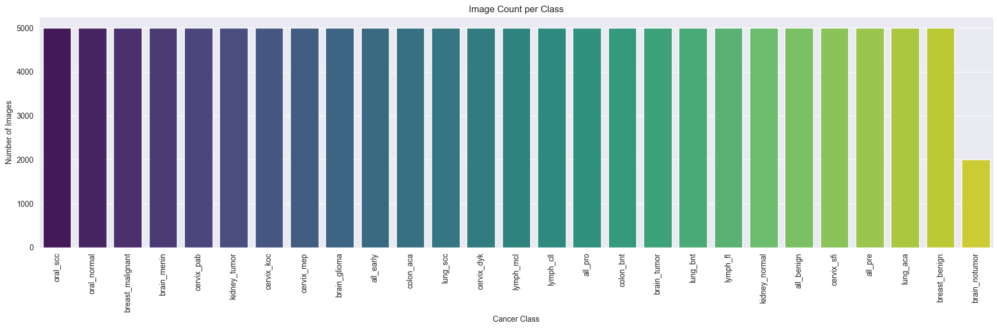

In [6]:
plt.figure(figsize=(18, 6))
sns.countplot(data=df, x='label', order=df['label'].value_counts().index, palette='viridis')
plt.xticks(rotation=90)
plt.title('Image Count per Class')
plt.xlabel('Cancer Class')
plt.ylabel('Number of Images')
plt.tight_layout()
plt.show()


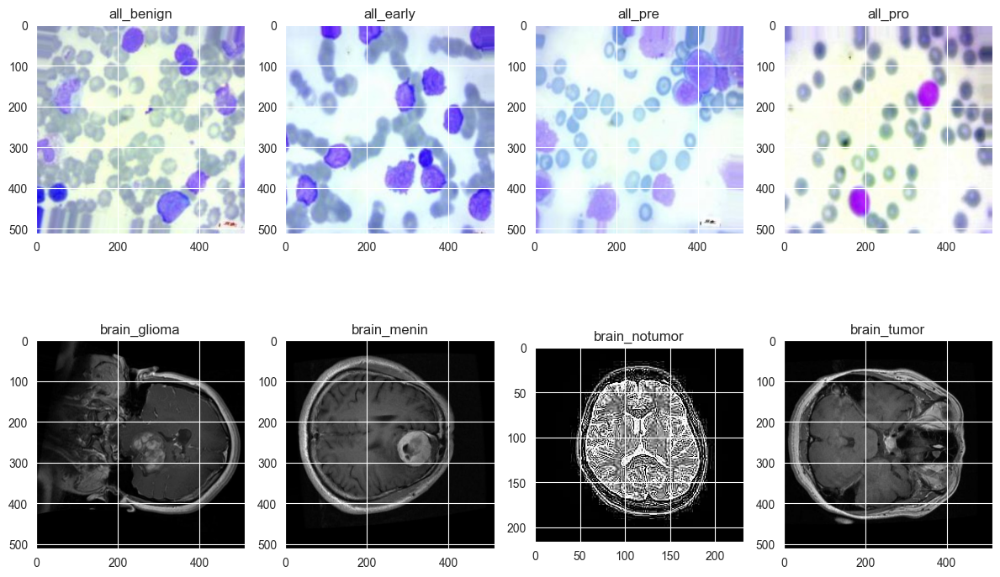

In [7]:

plt.figure(figsize=(12, 8))
for i, cls in enumerate(classes[:8]):
    img_path = os.path.join(dataset_path, cls, random.choice(os.listdir(os.path.join(dataset_path, cls))))
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(2, 4, i + 1)
    plt.imshow(img)
    plt.title(cls)
    plt.axis("on")

plt.tight_layout()
plt.show()


C:\Users\saish\AppData\Local\Temp\ipykernel_5240\2493332169.py:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sample_per_class = df.groupby('label').apply(lambda x: x.sample(1)).reset_index(drop=True)


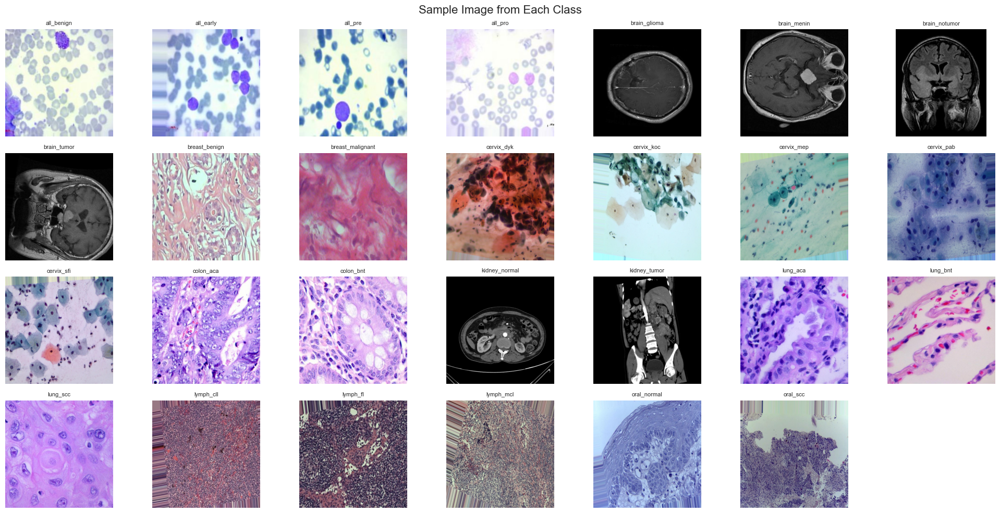

In [8]:
import random
from PIL import Image

# Display one random image from each class
sample_per_class = df.groupby('label').apply(lambda x: x.sample(1)).reset_index(drop=True)

plt.figure(figsize=(20, 10))
for idx, row in enumerate(sample_per_class.itertuples()):
    img = Image.open(row.file_path)
    plt.subplot(4, 7, idx + 1)  # 27 classes (4x7 grid)
    plt.imshow(img)
    plt.axis('off')
    plt.title(row.label, fontsize=8)

plt.suptitle("Sample Image from Each Class", fontsize=16)
plt.tight_layout()
plt.show()


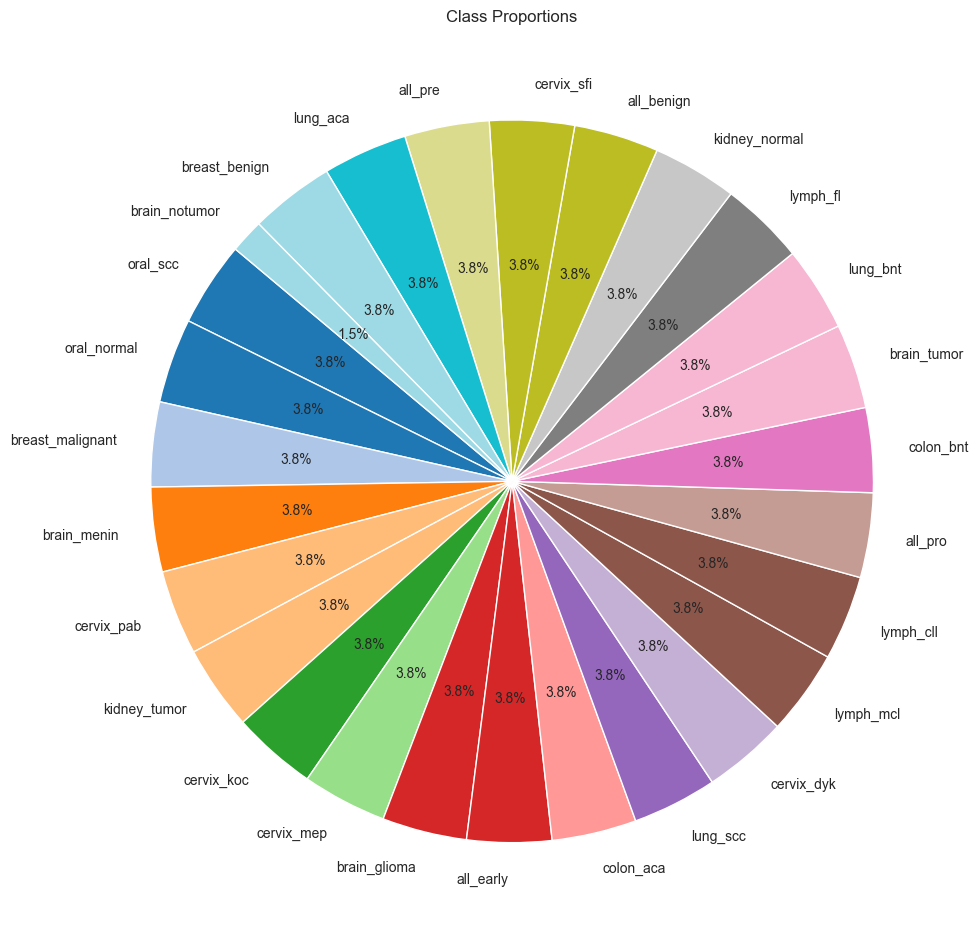

In [9]:
plt.figure(figsize=(10, 10))
df['label'].value_counts().plot.pie(autopct='%1.1f%%', startangle=140, cmap='tab20')
plt.title("Class Proportions")
plt.ylabel('')
plt.tight_layout()
plt.show()


In [10]:
train_datagen = ImageDataGenerator(
     rescale=1./255,                 # Normalize pixel values to [0, 1]
    rotation_range=10,             # Rotate max 10 degrees
    width_shift_range=0.1,         # Shift width by max 10%
    height_shift_range=0.1,        # Shift height by max 10%
    shear_range=0.05,              # Slight shearing
    zoom_range=0.1,                # Max 10% zoom in/out
    horizontal_flip=True,          # Still useful for symmetry-based tasks
    brightness_range=[0.8, 1.2],   # Controlled brightness adjustment
    fill_mode="nearest",
    validation_split=0.2
)
test_datagen = ImageDataGenerator(rescale=1./255,
                                 validation_split=0.1)

val_datagen = ImageDataGenerator(rescale=1./255,
                                 validation_split=0.2)

IMAGE_SIZE = (224, 224)
BATCH_SIZE = 16 # or 32

train_generator = train_datagen.flow_from_directory(
    dataset_path,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training',
    shuffle=True
)

val_generator = val_datagen.flow_from_directory(
    dataset_path,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation',
    shuffle=False
)

test_generator = test_datagen.flow_from_directory(
   dataset_path,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation',
    shuffle=False
)

class_indices = train_generator.class_indices
num_classes = len(class_indices)
print("Number of Classes:", num_classes)

Found 105602 images belonging to 27 classes.
Found 26400 images belonging to 27 classes.
Found 13200 images belonging to 27 classes.
Number of Classes: 27


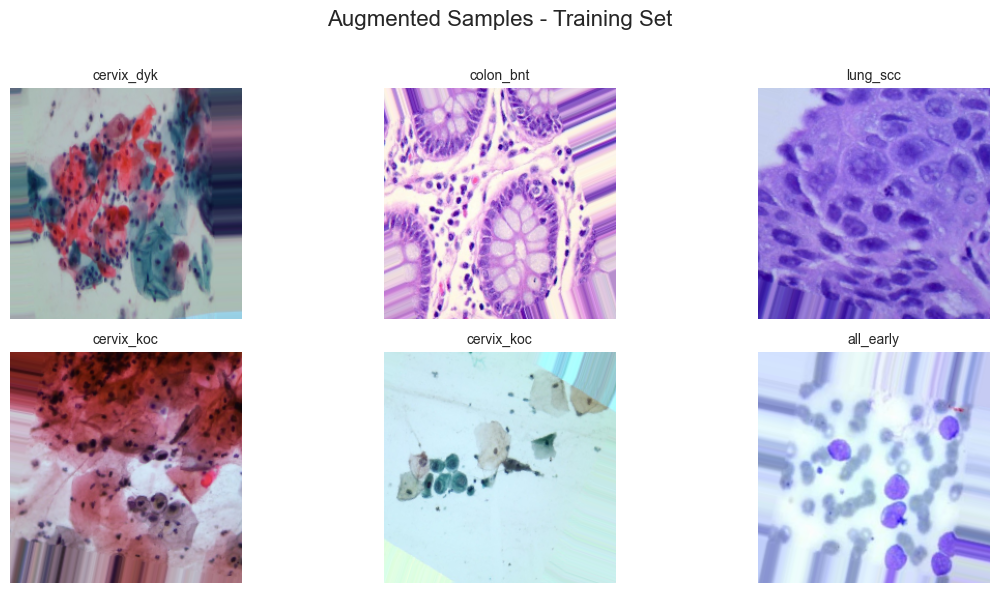

In [11]:
def plot_sample_images(generator, title, num_images=6):
    images, labels = next(generator)  # Get one batch
    class_names = list(generator.class_indices.keys())

    plt.figure(figsize=(12, 6))
    plt.suptitle(f"Augmented Samples - {title}", fontsize=16)

    for i in range(num_images):
        plt.subplot(2, num_images // 2, i + 1)
        plt.imshow(images[i])
        label_idx = np.argmax(labels[i])
        plt.title(class_names[label_idx], fontsize=10)
        plt.axis('off')

    plt.tight_layout()
    plt.subplots_adjust(top=0.85)
    plt.show()

# Plot images
plot_sample_images(train_generator, "Training Set")


# DenseNet201 Model Implementation
Let's build a complex DenseNet201-based model with transfer learning and advanced architecture for multi-class cancer classification.

In [12]:
# Define base model with DenseNet201
base_model = DenseNet201(
    weights='imagenet',
    include_top=False,
    input_shape=(224, 224, 3)
)

for layer in base_model.layers:
    layer.trainable = True

# Build complex model architecture
inputs = base_model.input
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(512, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.3)(x)
outputs = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

In [13]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0          ['input_1[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (None, 112, 112, 64  9408        ['zero_padding2d[0][0]']         
                                )                                                                 
                                                                                              

In [14]:
# Compile model with mixed precision
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Define callbacks
callbacks = [
    EarlyStopping(
        monitor='val_loss',
        patience=5,
        restore_best_weights=True,
        verbose=1
    ),
    ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.2,
        patience=3,
        min_lr=1e-6,
        verbose=1
    ),
    ModelCheckpoint(
        'DenseNet_201_model.keras',
        monitor='val_loss',
        save_best_only=True,
        verbose=1
    )
]

In [15]:
# Train the model
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=50,
    callbacks=callbacks,
    verbose=1
)

Epoch 1/50
6601/6601 [==============================] - ETA: 0s - loss: 0.6076 - accuracy: 0.7810
Epoch 1: val_loss improved from inf to 1.04352, saving model to DenseNet_201_model.keras
6601/6601 [==============================] - 1816s 272ms/step - loss: 0.6076 - accuracy: 0.7810 - val_loss: 1.0435 - val_accuracy: 0.7555 - lr: 0.0010
Epoch 2/50
6601/6601 [==============================] - ETA: 0s - loss: 0.2849 - accuracy: 0.8955
Epoch 2: val_loss improved from 1.04352 to 0.35632, saving model to DenseNet_201_model.keras
6601/6601 [==============================] - 1977s 299ms/step - loss: 0.2849 - accuracy: 0.8955 - val_loss: 0.3563 - val_accuracy: 0.8781 - lr: 0.0010
Epoch 3/50
6601/6601 [==============================] - ETA: 0s - loss: 0.1950 - accuracy: 0.9306
Epoch 3: val_loss improved from 0.35632 to 0.16214, saving model to DenseNet_201_model.keras
6601/6601 [==============================] - 1790s 271ms/step - loss: 0.1950 - accuracy: 0.9306 - val_loss: 0.1621 - val_accuracy

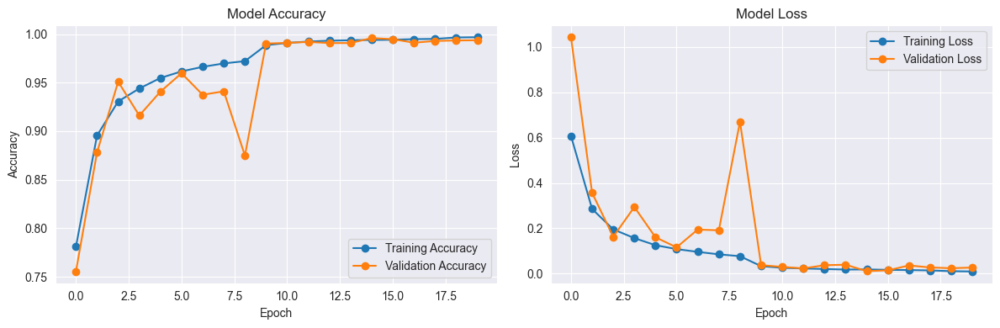

In [16]:
# Plot training history
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy', marker='o')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss', marker='o')
plt.plot(history.history['val_loss'], label='Validation Loss', marker='o')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [17]:
# Evaluate model on test set
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"\nTest Accuracy: {test_accuracy:.4f}")
print(f"Test Loss: {test_loss:.4f}")


825/825 [==============================] - 32s 39ms/step - loss: 0.0093 - accuracy: 0.9963

Test Accuracy: 0.9963
Test Loss: 0.0093


825/825 [==============================] - 32s 36ms/step


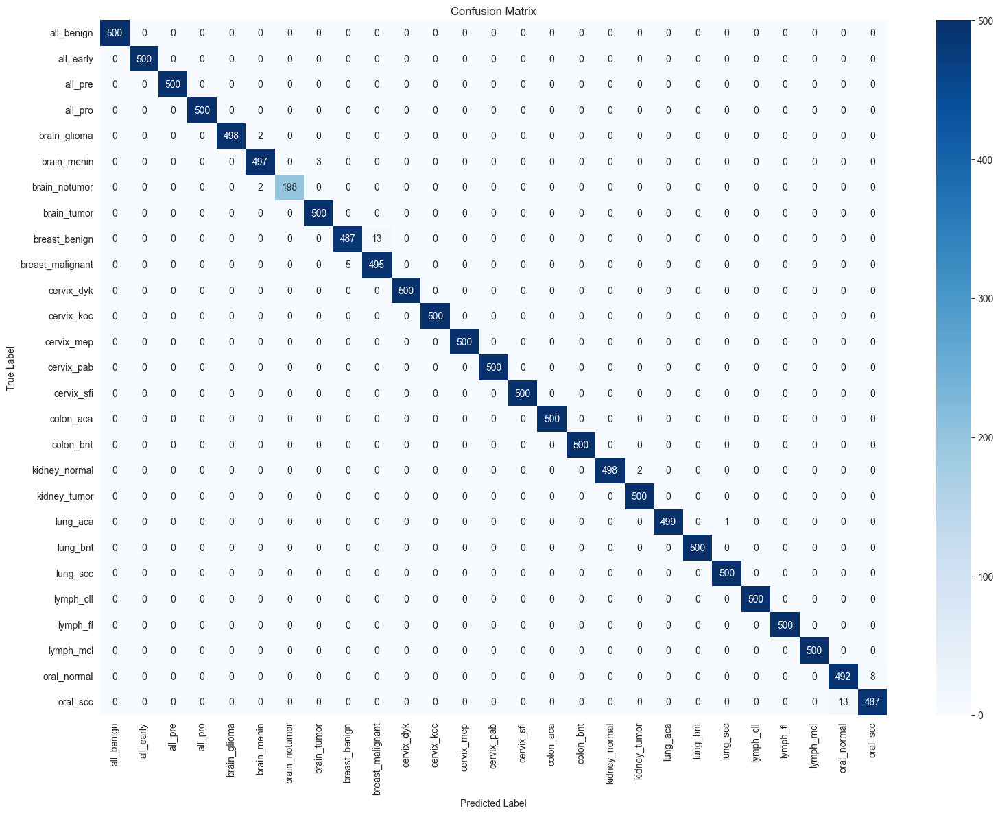

In [18]:
y_pred_probs = model.predict(test_generator)
y_pred = np.argmax(y_pred_probs, axis=1)

# Step 2: Get true labels
y_true = test_generator.classes

# Step 3: Get class labels
class_names = list(test_generator.class_indices.keys())

# Step 4: Confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Step 5: Plot it
plt.figure(figsize=(16, 12))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


In [19]:
print(classification_report(y_true, y_pred, target_names=class_names))

                  precision    recall  f1-score   support

      all_benign       1.00      1.00      1.00       500
       all_early       1.00      1.00      1.00       500
         all_pre       1.00      1.00      1.00       500
         all_pro       1.00      1.00      1.00       500
    brain_glioma       1.00      1.00      1.00       500
     brain_menin       0.99      0.99      0.99       500
   brain_notumor       1.00      0.99      0.99       200
     brain_tumor       0.99      1.00      1.00       500
   breast_benign       0.99      0.97      0.98       500
breast_malignant       0.97      0.99      0.98       500
      cervix_dyk       1.00      1.00      1.00       500
      cervix_koc       1.00      1.00      1.00       500
      cervix_mep       1.00      1.00      1.00       500
      cervix_pab       1.00      1.00      1.00       500
      cervix_sfi       1.00      1.00      1.00       500
       colon_aca       1.00      1.00      1.00       500
       colon_

Let's plot ROC curves and calculate AUC scores for:
1. Each class separately
2. Micro-average ROC curve (calculated by treating it as a binary classification using one-vs-rest)
3. Macro-average ROC curve (averaging the ROC curves of all classes)

In [20]:
# Compute ROC curve and ROC area for each class
y_test = label_binarize(test_generator.classes, classes=range(num_classes))
y_score = y_pred_probs

fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Compute macro-average ROC curve and ROC area
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

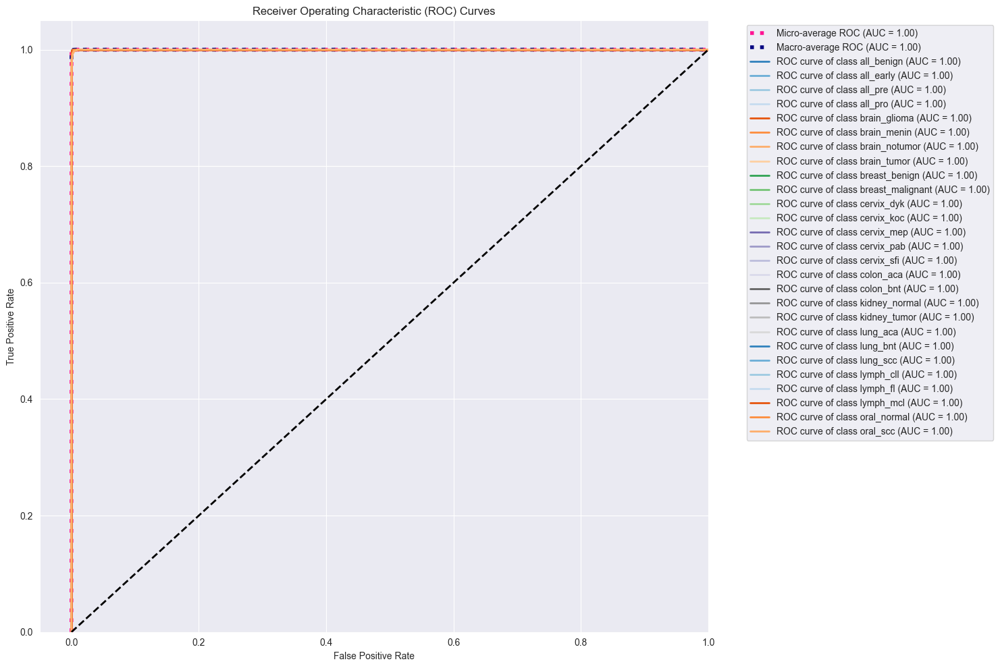

In [21]:
# Plot ROC curves
plt.figure(figsize=(15, 10))

# Plot micro-average ROC curve
plt.plot(fpr["micro"], tpr["micro"],
         label=f'Micro-average ROC (AUC = {roc_auc["micro"]:.2f})',
         color='deeppink', linestyle=':', linewidth=4)

# Plot macro-average ROC curve
plt.plot(fpr["macro"], tpr["macro"],
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})',
         color='navy', linestyle=':', linewidth=4)

# Plot ROC curves for each class
colors = cycle(plt.cm.tab20c.colors)
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve of class {class_names[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([-0.05, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

825/825 [==============================] - 32s 38ms/step


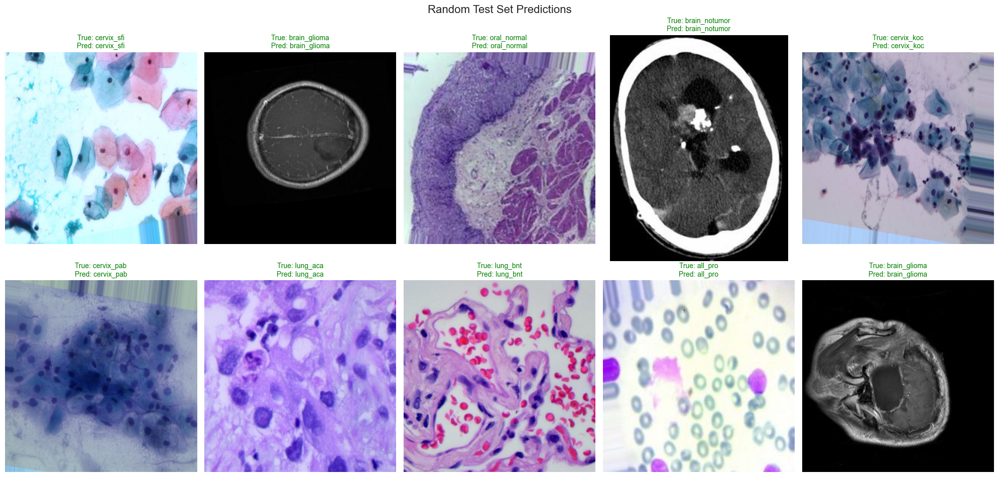

In [22]:
test_generator.reset()
preds = model.predict(test_generator, verbose=1)
pred_classes = np.argmax(preds, axis=1)
true_classes = test_generator.classes
file_paths = test_generator.filepaths
class_names = list(test_generator.class_indices.keys())

# Pick random N images to display
num_samples = 10
indices = random.sample(range(len(file_paths)), num_samples)

plt.figure(figsize=(20, 10))

for i, idx in enumerate(indices):
    img_path = file_paths[idx]
    img = Image.open(img_path)

    pred_label = class_names[pred_classes[idx]]
    true_label = class_names[true_classes[idx]]

    color = "green" if pred_label == true_label else "red"

    plt.subplot(2, num_samples // 2, i + 1)
    plt.imshow(img)
    plt.title(f"True: {true_label}\nPred: {pred_label}", color=color, fontsize=10)
    plt.axis("off")

plt.suptitle("Random Test Set Predictions", fontsize=16)
plt.tight_layout()
plt.show()

In [23]:
def predict_image(model, img_path, class_names, image_size=(224, 224)):
    # Load and preprocess image
    img = image.load_img(img_path, target_size=image_size)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # Predict
    predictions = model.predict(img_array)[0]
    predicted_index = np.argmax(predictions)
    predicted_class = class_names[predicted_index]
    confidence = predictions[predicted_index]

    # --- Visualization ---
    plt.figure(figsize=(12, 10))

    # Show image
    plt.subplot(2, 1, 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Predicted: {predicted_class} ({confidence * 100:.2f}%)", fontsize=14, color='green')

    # Horizontal bar chart for confidence
    plt.subplot(2, 1, 2)
    bars = plt.barh(class_names, predictions, color='skyblue')
    bars[predicted_index].set_color('green')  # highlight predicted class
    plt.xlabel("Confidence Score")
    plt.xlim(0, 1)
    plt.tight_layout()
    plt.show()

    print(f"Predicted Label: {predicted_class}")
    print(f"Confidence: {confidence:.4f}")

1/1 [==============================] - 2s 2s/step


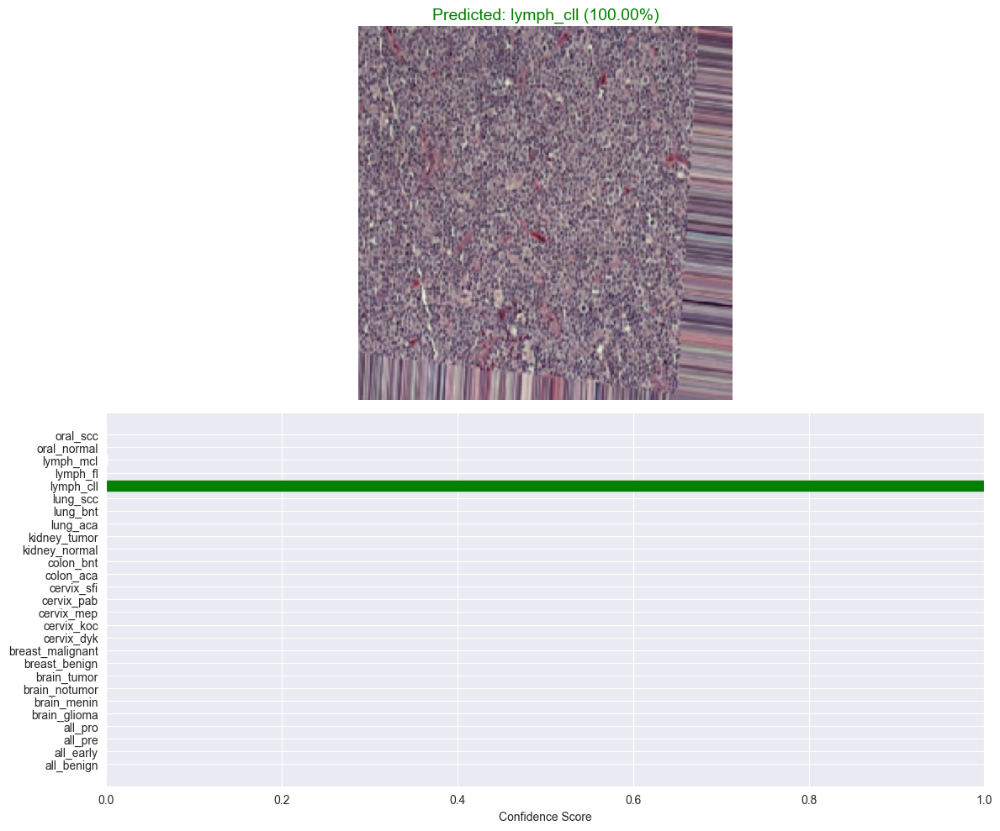

Predicted Label: lymph_cll
Confidence: 1.0000


In [24]:
your_image_path = "Multi_Class_p1/Multi Cancer/Unified_Classes/lymph_cll/lymph_cll_0015.jpg"
class_names = list(test_generator.class_indices.keys())  # Use your model's classes

predict_image(model, your_image_path, class_names)

1/1 [==============================] - 0s 32ms/step


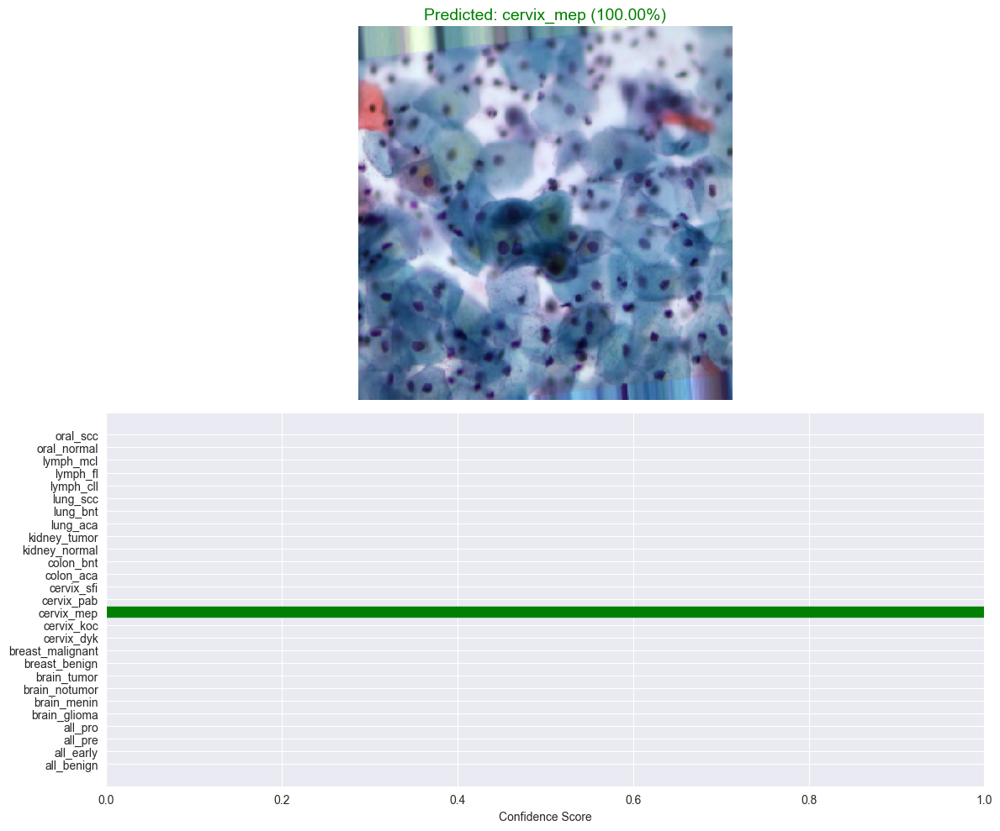

Predicted Label: cervix_mep
Confidence: 1.0000


In [25]:
your_image_path = "Multi_Class_p1/Multi Cancer/Unified_Classes/cervix_mep/cervix_mep_0007.jpg"
class_names = list(test_generator.class_indices.keys())  # Use your model's classes

predict_image(model, your_image_path, class_names)

1/1 [==============================] - 0s 32ms/step


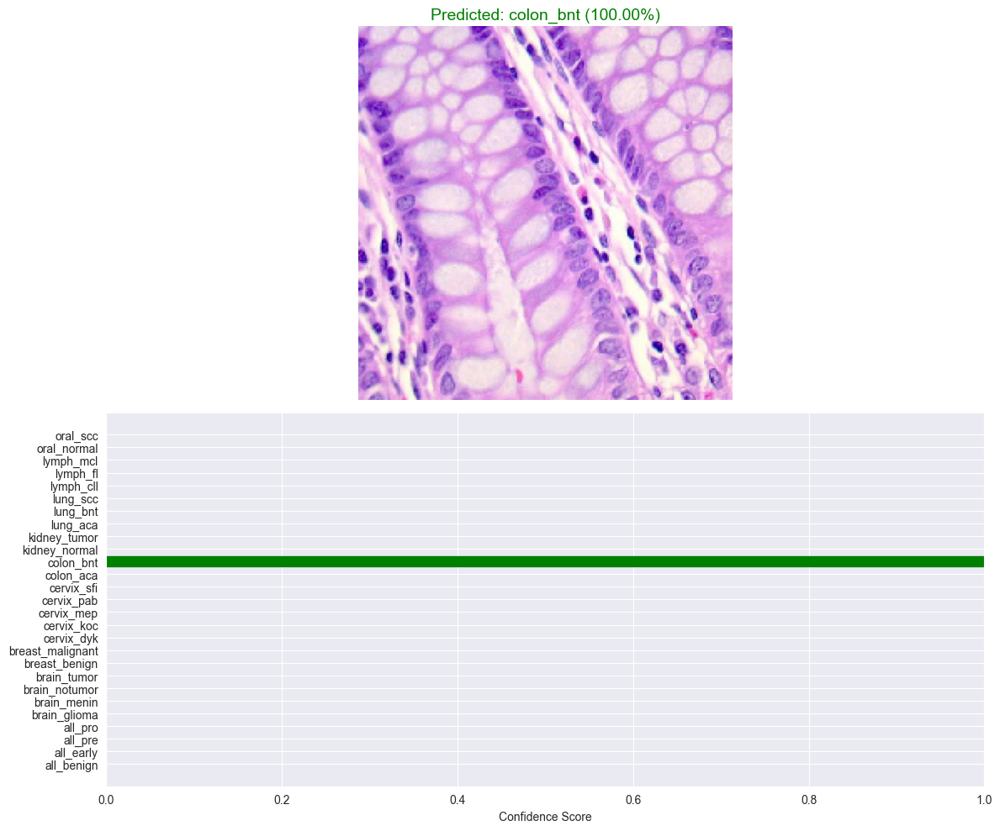

Predicted Label: colon_bnt
Confidence: 1.0000


In [26]:
your_image_path = "Multi_Class_p1/Multi Cancer/Unified_Classes/colon_bnt/colon_bnt_0006.jpg"
class_names = list(test_generator.class_indices.keys())  # Use your model's classes

predict_image(model, your_image_path, class_names)

1/1 [==============================] - 0s 31ms/step


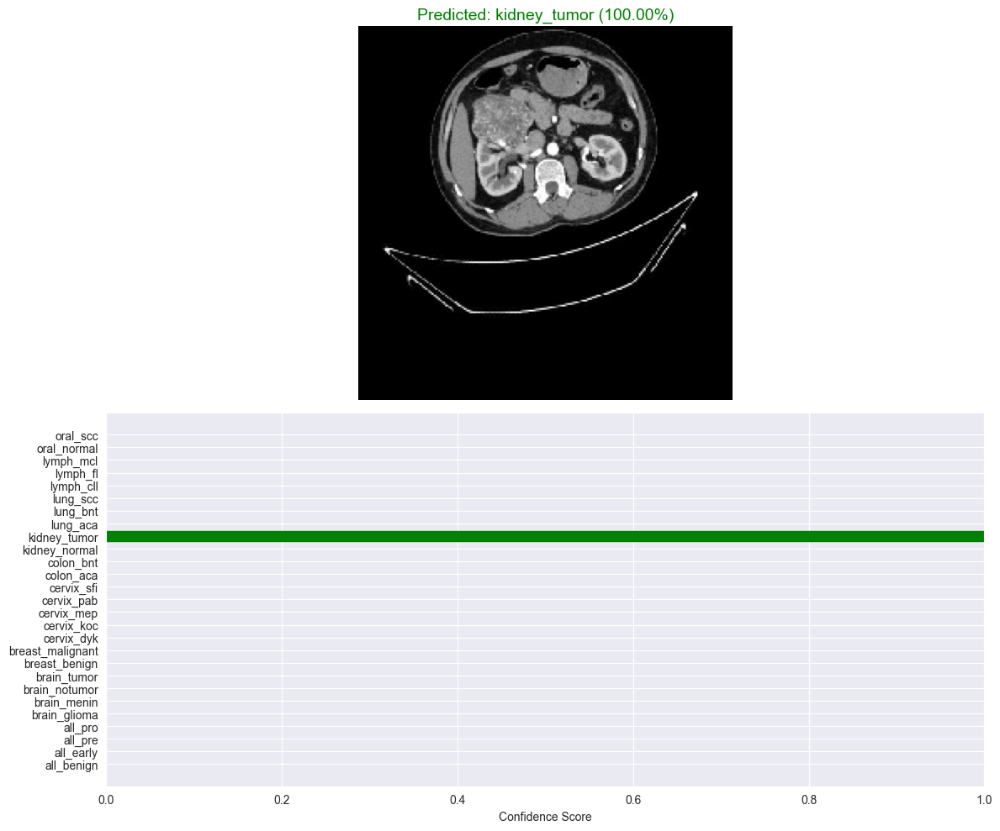

Predicted Label: kidney_tumor
Confidence: 1.0000


In [27]:
your_image_path = "Multi_Class_p1/Multi Cancer/Unified_Classes/kidney_tumor/kidney_tumor_0015.jpg"
class_names = list(test_generator.class_indices.keys())  # Use your model's classes

predict_image(model, your_image_path, class_names)

1/1 [==============================] - 0s 32ms/step


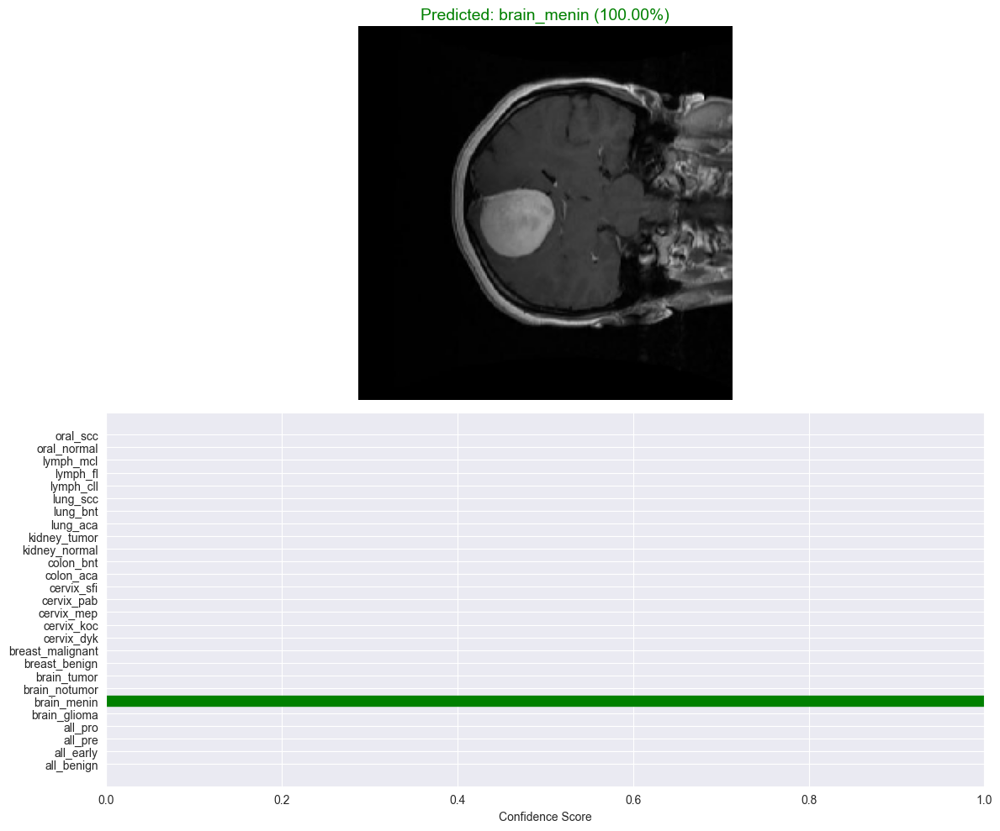

Predicted Label: brain_menin
Confidence: 1.0000


In [28]:
your_image_path = "Multi_Class_p1/Multi Cancer/Unified_Classes/brain_menin/brain_menin_0008.jpg"
class_names = list(test_generator.class_indices.keys())  # Use your model's classes

predict_image(model, your_image_path, class_names)

1/1 [==============================] - 3s 3s/step


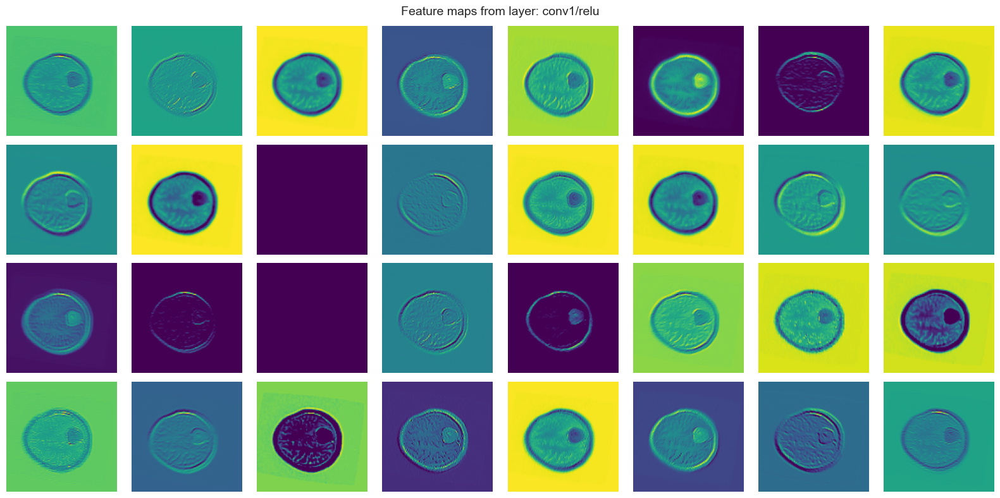

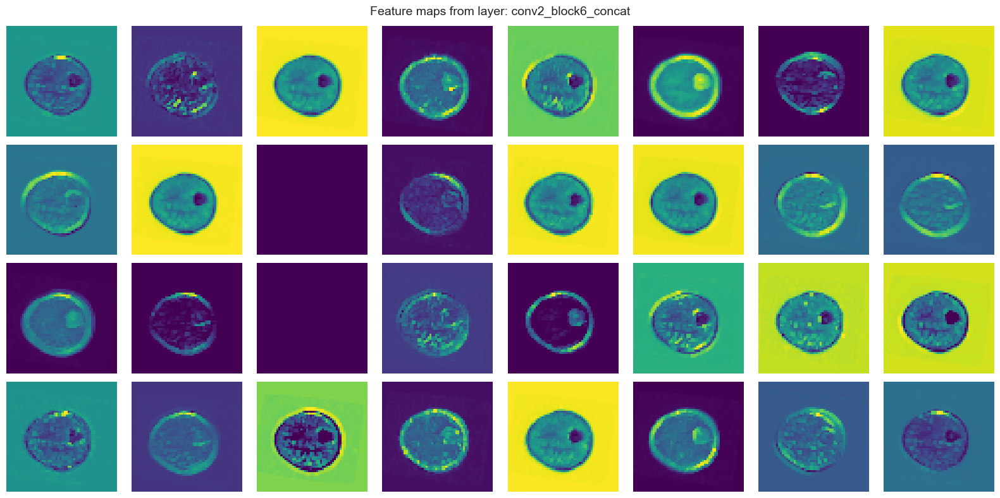

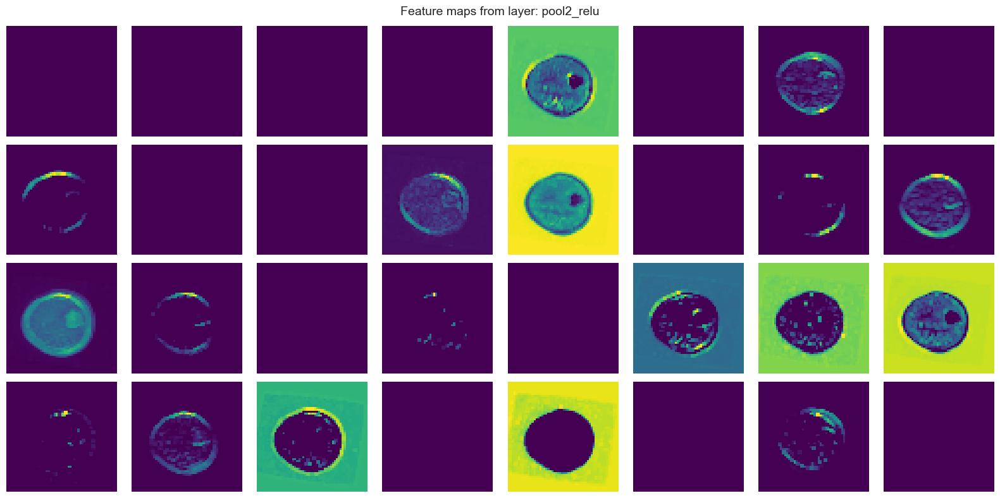

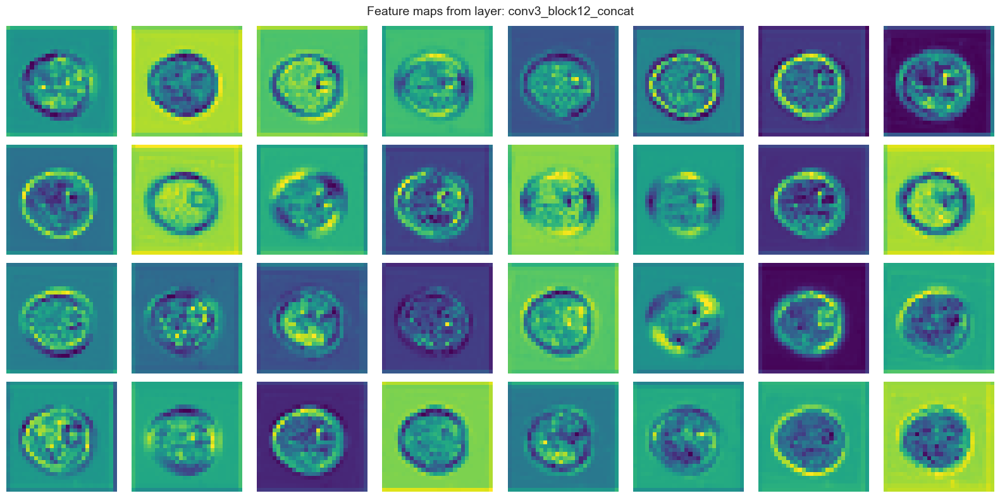

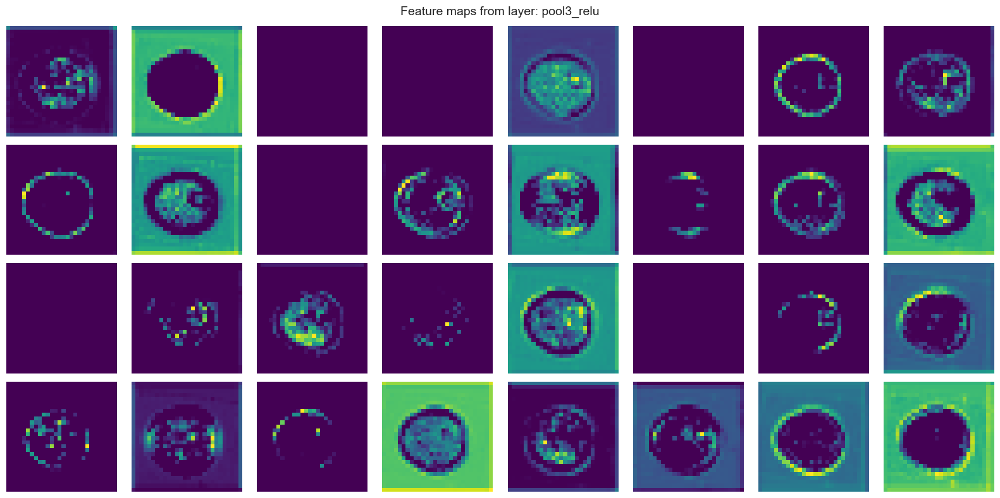

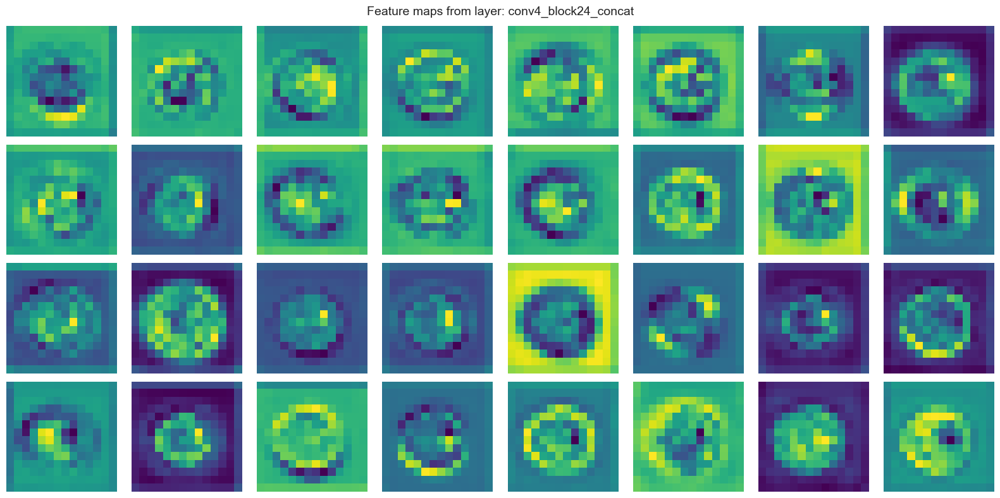

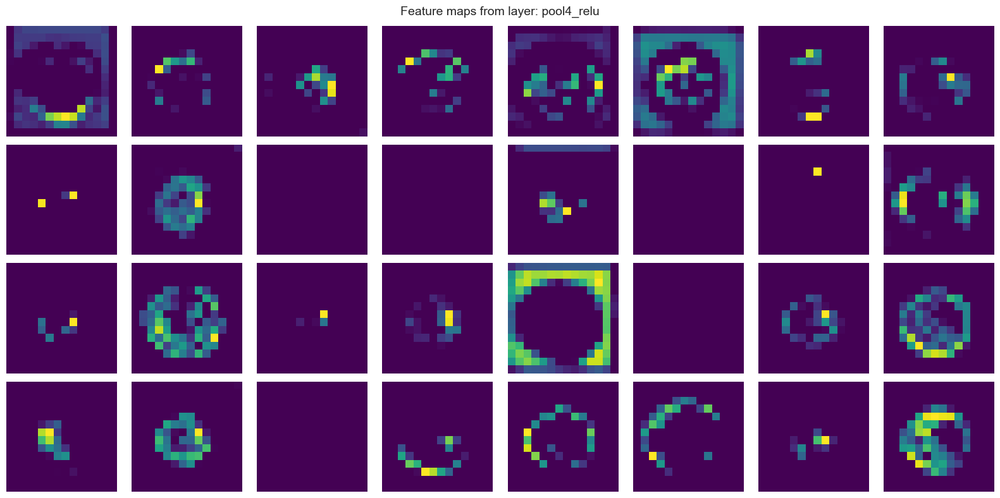

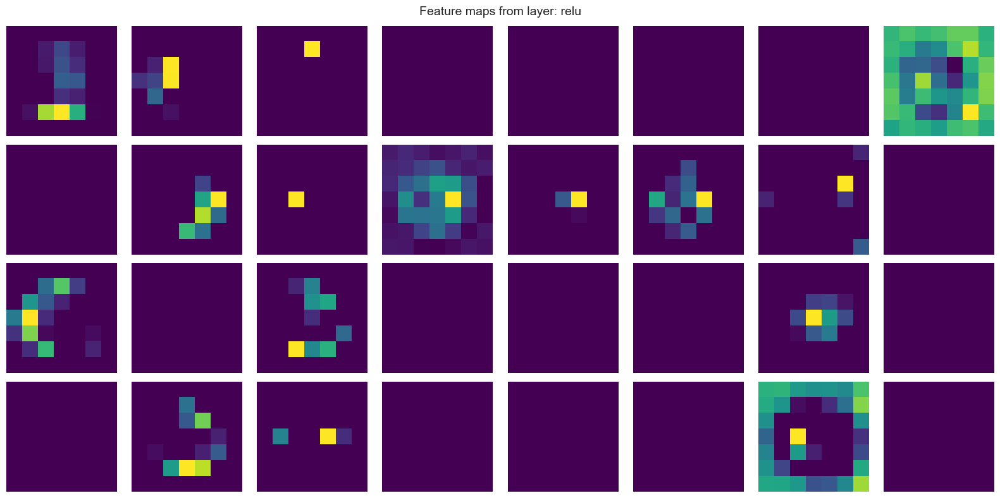

In [30]:
# Load the trained DenseNet201 model
model = load_model("DenseNet_201_model.keras")  # Adjust path if needed

# Load and preprocess an image
img_path = "Multi_Class_p1/Multi Cancer/Unified_Classes/brain_menin/brain_menin_0010.jpg"  # Adjust path
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img) / 255.0
img_array = np.expand_dims(img_array, axis=0)

# List of key DenseNet201 layers for feature map visualization
main_layer_names = [
    'conv1/relu',                             # Initial Conv
    'pool2_relu',                             # After Dense Block 1
    'conv2_block6_concat',                   # Mid Dense Block 1
    'pool3_relu',                             # After Dense Block 2
    'conv3_block12_concat',                  # Mid Dense Block 2
    'pool4_relu',                             # After Dense Block 3
    'conv4_block24_concat',                  # Mid Dense Block 3
    'relu'                                    # Final Activation (Post Dense Block 4)
]

# Extract corresponding layer outputs
layer_outputs = []
valid_layer_names = []

for layer in model.layers:
    if layer.name in main_layer_names:
        layer_outputs.append(layer.output)
        valid_layer_names.append(layer.name)

# Build activation model
activation_model = Model(inputs=model.input, outputs=layer_outputs)

# Generate activations
activations = activation_model.predict(img_array)

# Visualize the feature maps
for layer_name, layer_activation in zip(valid_layer_names, activations):
    n_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]

    n_cols = min(8, n_features)
    n_rows = min(4, (n_features + n_cols - 1) // n_cols)

    fig = plt.figure(figsize=(n_cols * 2, n_rows * 2))
    fig.suptitle(f'Feature maps from layer: {layer_name}', fontsize=14)

    for i in range(n_rows * n_cols):
        if i < n_features:
            ax = plt.subplot(n_rows, n_cols, i + 1)
            ax.imshow(layer_activation[0, :, :, i], cmap='viridis')
            ax.axis('off')

    plt.tight_layout()
    plt.show()

# End